In [1]:
import torch
from diffusers import DDPMPipeline

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

pipeline = DDPMPipeline.from_pretrained('hg-im-size-128-epochs-50-ddpm').to(device)

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

In [3]:
from datasets import load_dataset

dataset_name = "pcuenq/lsun-bedrooms"
dataset = load_dataset(dataset_name, split="train", cache_dir='data')

In [5]:
from torchvision import transforms

image_size = 128

preprocess = transforms.Compose(
    [
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}

dataset.set_transform(transform)

# train_dataloader = torch.utils.data.DataLoader(dataset, 
#                                                batch_size=config.train_batch_size, 
#                                                shuffle=True)

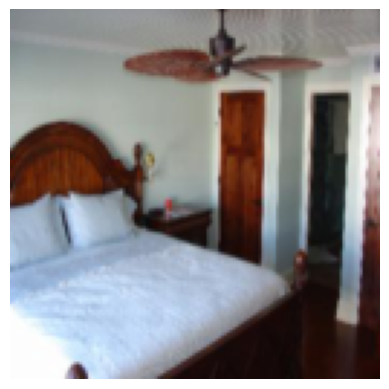

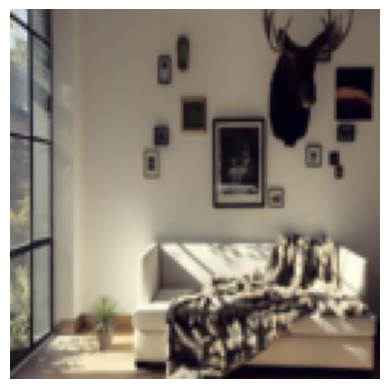

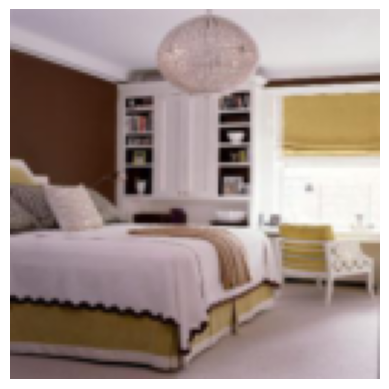

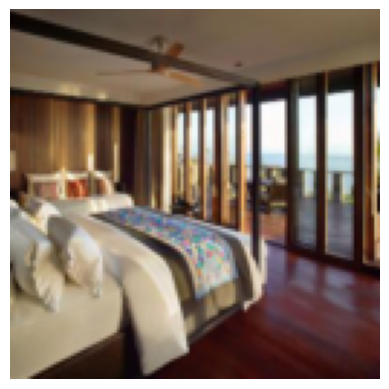

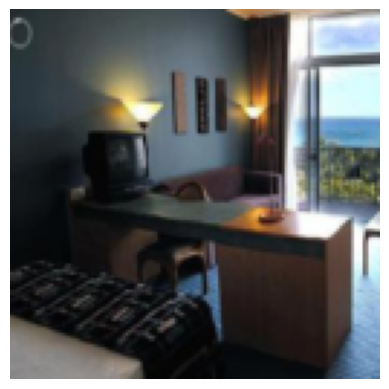

...

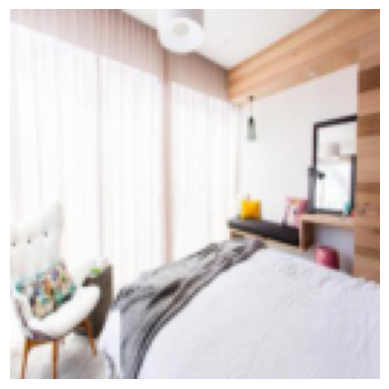

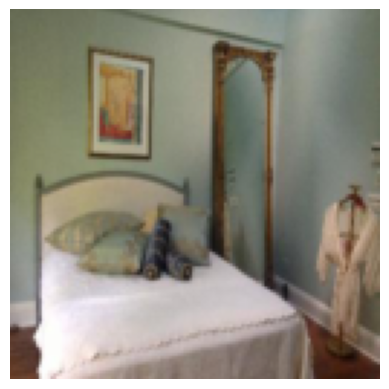

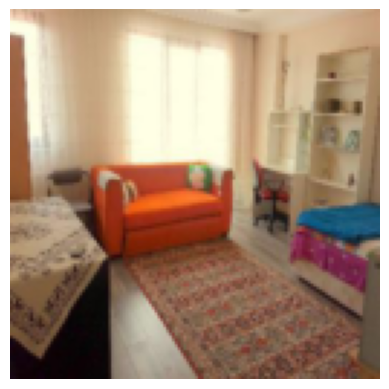

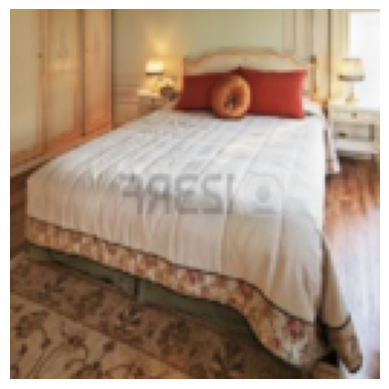

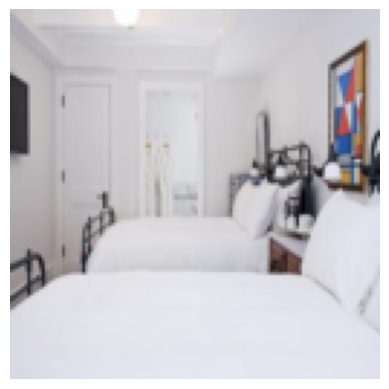

In [37]:
import numpy as np
import matplotlib.pyplot as plt

for i, image in enumerate(dataset):
    np_array = image['images'].numpy()
    np_array = np.transpose(np_array, (1, 2, 0))

    # Normalize the values to the range [0, 1] for displaying as an image
    np_array = (np_array - np_array.min()) / (np_array.max() - np_array.min())
    
    # Plot the image
    plt.imshow(np_array)
    plt.axis('off')
    plt.show()
    print()
    if i == 3:
        first = image['images']
    if i == 7:
        second = image['images']
    if i == 15:
        break

In [38]:
def plot_img(tensor):
    np_array = tensor.numpy()
    np_array = np.transpose(np_array, (1, 2, 0))

    # Normalize the values to the range [0, 1] for displaying as an image
    np_array = (np_array - np_array.min()) / (np_array.max() - np_array.min())
    
    # Plot the image
    plt.imshow(np_array)
    plt.axis('off')
    plt.show()

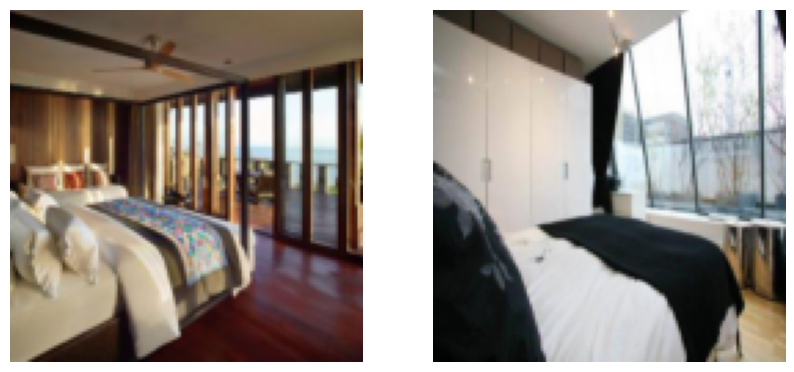

In [39]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def plot_img_side_by_side(tensor1, tensor2):
    def process_tensor(tensor):
        np_array = tensor.numpy()
        np_array = np.transpose(np_array, (1, 2, 0))
        np_array = (np_array - np_array.min()) / (np_array.max() - np_array.min())
        return np_array

    img1 = process_tensor(tensor1)
    img2 = process_tensor(tensor2)
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(img1)
    axes[0].axis('off')
    axes[1].imshow(img2)
    axes[1].axis('off')
    
    plt.show()

plot_img_side_by_side(first, second)

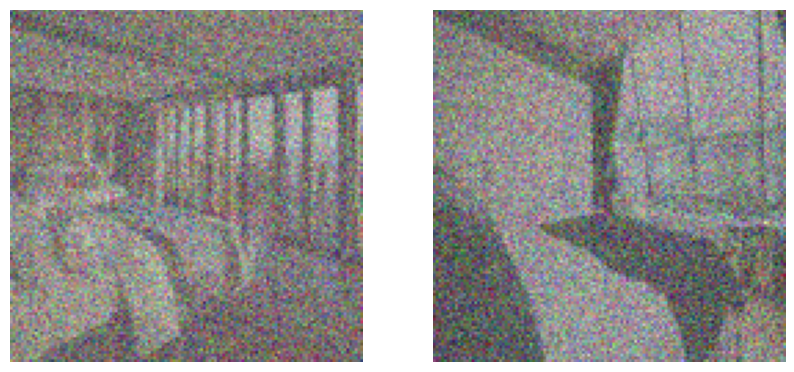

In [79]:
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

def add_noise_to_image(image, timesteps:int, noise_scheduler):
    sample_image = image.unsqueeze(dim=0)
    noise = torch.randn(sample_image.shape)
    timesteps = torch.LongTensor([timesteps])
    noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)
    return noisy_image

timesteps = 200

first_with_noise = add_noise_to_image(first, timesteps, noise_scheduler)
second_with_noise = add_noise_to_image(second, timesteps, noise_scheduler)

plot_img_side_by_side(first_with_noise.squeeze(), second_with_noise.squeeze())

In [80]:
def linear_combination(tensor1, tensor2, lambda_param):
    """
    Perform a linear combination of two tensors using the parameter lambda_param.
    
    Args:
    tensor1 (torch.Tensor): The first tensor of shape [1, 3, 128, 128].
    tensor2 (torch.Tensor): The second tensor of shape [1, 3, 128, 128].
    lambda_param (float): The parameter lambda used for the linear combination.
    
    Returns:
    torch.Tensor: The resulting tensor after the linear combination.
    """
    # Ensure the tensors are of the same shape
    if tensor1.shape != tensor2.shape:
        raise ValueError("The input tensors must have the same shape")
    
    # Compute the linear combination
    result = lambda_param * tensor1 + (1 - lambda_param) * tensor2
    
    return result

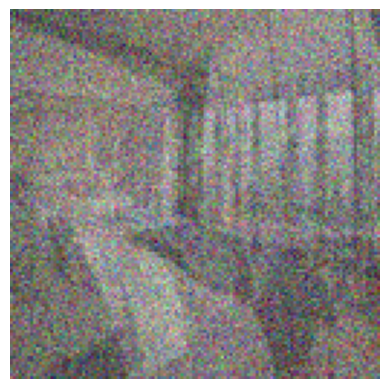

In [81]:
combined = linear_combination(first_with_noise, second_with_noise, 0.5)

plot_img(combined.squeeze())

In [75]:
from tqdm.auto import tqdm

sample = combined.to(device)
model = pipeline.unet

for i, t in tqdm(enumerate(noise_scheduler.timesteps)):

    with torch.no_grad():
        residual = model(sample, t).sample

    sample = noise_scheduler.step(residual, t, sample).prev_sample

0it [00:00, ?it/s]

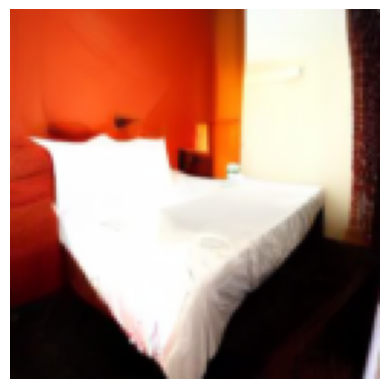

In [76]:
plot_img(sample.cpu().squeeze())

In [86]:
def process_tensor(tensor):
    np_array = tensor.numpy()
    np_array = np.transpose(np_array, (1, 2, 0))
    np_array = (np_array - np_array.min()) / (np_array.max() - np_array.min())
    return np_array

In [87]:
lambdas = np.linspace(0, 1, 5)
timesteps_list = [0, 100, 200, 500, 750, 999]

Reconstructing λ=0.0, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.25, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.75, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=100:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.25, t=100:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5, t=100:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.75, t=100:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=100:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=200:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.25, t=200:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5, t=200:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.75, t=200:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=200:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.25, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.75, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.25, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.75, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

IndexError: index 1000 is out of bounds for dimension 0 with size 1000

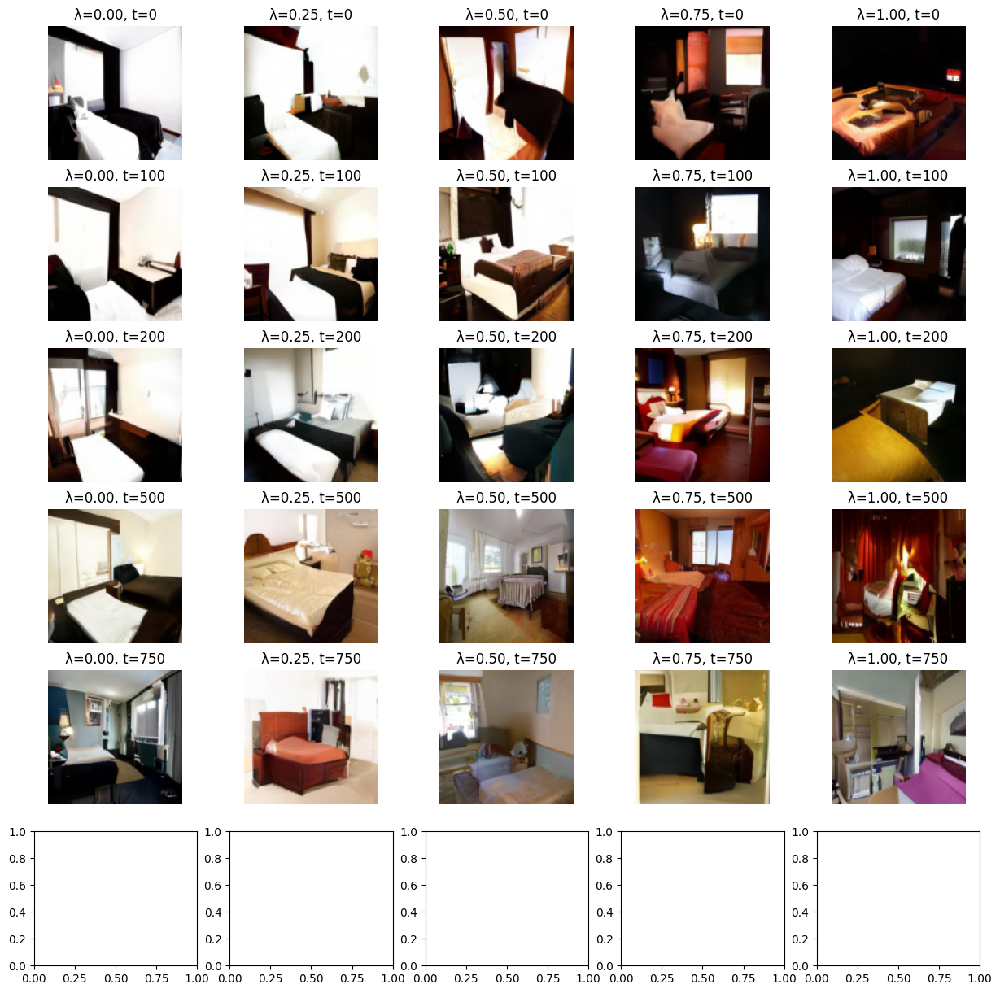

In [88]:
fig, axes = plt.subplots(len(timesteps_list), len(lambdas), figsize=(15, 15))

model = pipeline.unet
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

for i, timesteps in enumerate(timesteps_list):
    first_with_noise = add_noise_to_image(first, timesteps, noise_scheduler)
    second_with_noise = add_noise_to_image(second, timesteps, noise_scheduler)
    
    for j, lambda_param in enumerate(lambdas):
        combined = linear_combination(first_with_noise, second_with_noise, lambda_param)
        
        sample = combined.to(device)
        
        for t in tqdm(noise_scheduler.timesteps, desc=f"Reconstructing λ={lambda_param}, t={timesteps}"):
            with torch.no_grad():
                residual = model(sample, t).sample
            sample = noise_scheduler.step(residual, t, sample).prev_sample
        
        reconstructed_image = process_tensor(sample.cpu().squeeze())
        axes[i, j].imshow(reconstructed_image)
        axes[i, j].axis('off')
        axes[i, j].set_title(f"λ={lambda_param:.2f}, t={timesteps}")

plt.tight_layout()
plt.show()

Reconstructing λ=0.0, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=0:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=125:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=250:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=375:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=500:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=625:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=750:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=875:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.0, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.1111111111111111, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.2222222222222222, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.3333333333333333, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.4444444444444444, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.5555555555555556, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.6666666666666666, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.7777777777777777, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=0.8888888888888888, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

Reconstructing λ=1.0, t=999:   0%|          | 0/1000 [00:00<?, ?it/s]

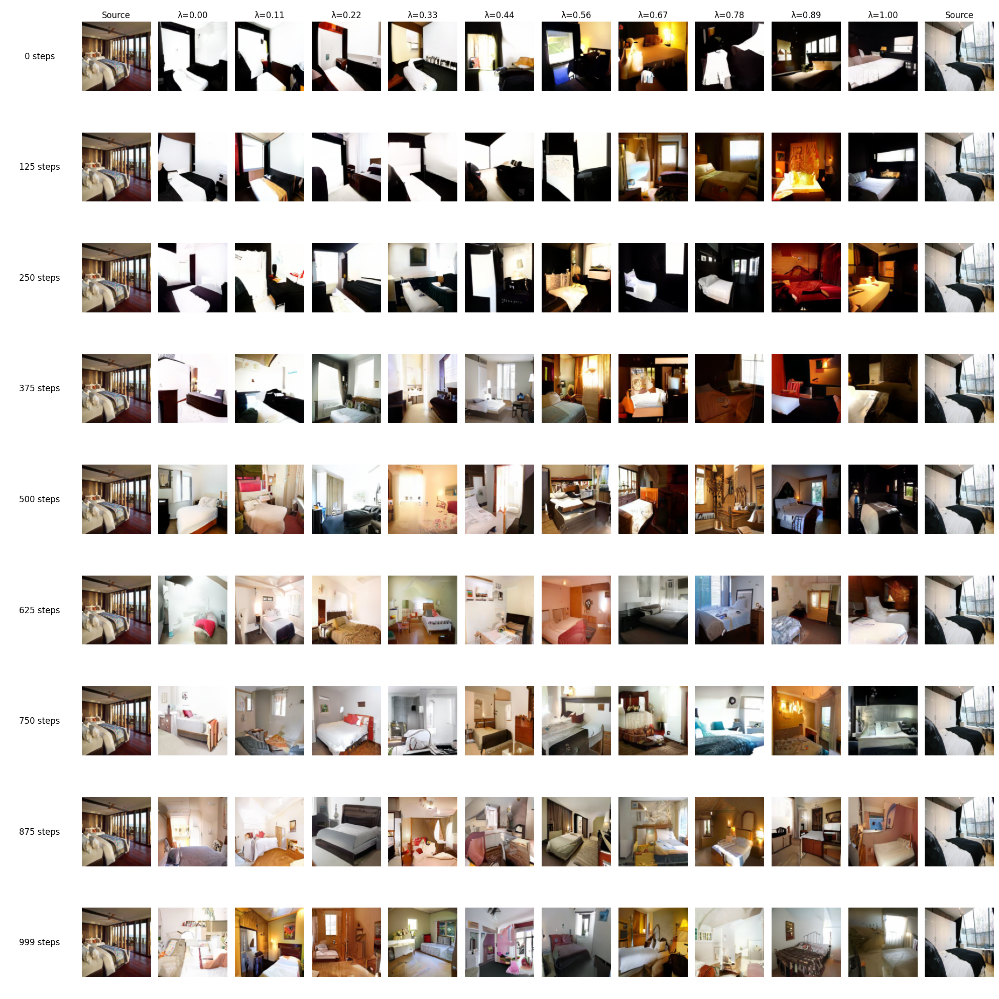

In [107]:
lambdas = np.linspace(0, 1, 10)
timesteps_list = [0, 125, 250, 375, 500, 625, 750, 875, 999]

# lambdas = [0.2, 0.5, 0.8]
# timesteps_list = [100, 250, 500, 750, 950]

model = pipeline.unet
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

fig, axes = plt.subplots(len(timesteps_list), len(lambdas) + 3, figsize=(20, 20))

for i, timesteps in enumerate(timesteps_list):
    first_with_noise = add_noise_to_image(first, timesteps, noise_scheduler)
    second_with_noise = add_noise_to_image(second, timesteps, noise_scheduler)

    axes[i, 0].text(0.5, 0.5, f'{timesteps} steps', fontsize=12, ha='center', va='center')
    axes[i, 0].axis('off')
    
    if i == 0:
        for j in range(len(timesteps_list)):
            axes[j, 1].imshow(process_tensor(first))
            axes[j, 1].axis('off')
            axes[j, -1].imshow(process_tensor(second))
            axes[j, -1].axis('off')
            if j == 0:
                axes[j, 1].set_title('Source')
                axes[j, -1].set_title('Source')

    for j, lambda_param in enumerate(lambdas):
        combined = linear_combination(first_with_noise, second_with_noise, lambda_param)

        sample = combined.to(device)

        for t in tqdm(noise_scheduler.timesteps, desc=f"Reconstructing λ={lambda_param}, t={timesteps}"):
            with torch.no_grad():
                residual = model(sample, t).sample
            sample = noise_scheduler.step(residual, t, sample).prev_sample

        reconstructed_image = process_tensor(sample.cpu().squeeze())
        axes[i, j+2].imshow(reconstructed_image)
        axes[i, j+2].axis('off')
        if i == 0:
            axes[i, j+2].set_title(f"λ={lambda_param:.2f}")

plt.tight_layout()
plt.show()